# License Plate Object Detection

## Step 1: Installation for Using NVIDIA GPU Device
License Plate Object Detection is the part of our Deep Learning Pipeline where we need to identify Region of Interest of the license plate that we want to recognize. Our Object Detection model will be using a ***YOLOv5*** method which has been created by ***ultralytics***. All Credits goes to every people who are involve in bringing YOLOv5 Method to live. The code can be accessed using this link https://github.com/ultralytics/yolov5.

The training of the data will be using NVIDIA GeForce GTX 1660 Ti device. But there are some things that we need to prepare for this project such as:
1. Installing CUDA Toolkit version 10.2 (use this [link](https://developer.nvidia.com/cuda-10.2-download-archive) for downloading it)
2. Installing CuDNN version 8.3.0 (or pick other version that is compatible with CUDA Toolkit version, check this [link](https://developer.nvidia.com/rdp/cudnn-archive) for further information)
3. Installing NVIDIA driver from this [link](https://www.nvidia.com/download/index.aspx) and choose the driver based on your GPU device name and type.
4. Installing Visual Studio 2019 using this [link](https://visualstudio.microsoft.com/thank-you-downloading-visual-studio/?sku=community&rel=16&utm_medium=microsoft&utm_source=docs.microsoft.com&utm_campaign=download+from+relnotes&utm_content=vs2019ga+button) 

## Step 2: Setting Up Environment
Python environment can be created using [anaconda](https://www.anaconda.com/) or [pipenv](https://pipenv.pypa.io/en/latest/) package by Python. In this project, pipenv is a tool that has been chosen for setting up environment. For starting things off, download the any Python version and then run ***pip install pipenv*** for installing pipenv package. Then setting up the environment at your project directory folder by running ***python -m pipenv --python 3.8.6***. Then you want to access or activate the environment using ***python -m pipenv shell***.

Next, we need to install libaries to enable pytorch to access GPU by installing python packages by using this command
***pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 torchaudio==0.9.0 -f https://download.pytorch.org/whl/torch_stable.html***

This command can be run in the jupyter notebook or in the command line (***make sure to run the command in the python environment we just created***)

## Step 3: Install Requirements for License Plate Object Detection Training

In [5]:
# # run this command if it takes too long just run it on the command prompt, inside the python environment
!pip install torch==1.9.0+cu102 torchvision==0.10.0+cu102 torchaudio==0.9.0 -f https://download.pytorch.org/whl/torch_stable.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html


In [6]:
import shutil
import torch
import os
import zipfile
from IPython.display import Image, clear_output

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.9.0+cu102 (NVIDIA GeForce GTX 1660 Ti)


## Step 4: Clone Repository
Clone yolov5 repository by ***ultralytics*** from this link https://github.com/ultralytics/yolov5

***Make sure that git has already installed in your computer and enabled to be executed from any file directory*** (set git into the environment variables)

In [7]:
# clone the repo from this link 'https://github.com/ultralytics/yolov5.git'
git_https = 'https://github.com/ultralytics/yolov5.git'
folder_name = 'yolov5'
if not os.path.exists(os.path.join(os.getcwd(), folder_name)):
    !git clone {git_https}
else:
    !cd yolov5 && git pull
    print(folder_name, 'already exists and up to date')

# install requirements of yolov5
!cd yolov5 && pip install -r requirements.txt
# install roboflow for data pulling
!pip install roboflow

Already up to date.
yolov5 already exists and up to date


## Step 5: Dataset Preparation
After collecting our data, we will be using roboflow (can be accessed from this [link](https://roboflow.com/)) which is a tool for anotating region of interest. In this case, the region of interest is license plate. After anotating, we can export into any form of a dataset that will be accepted by our model. We can export it manually or using an API. Since the API token is confidential to the author of this code. Download data from shared link Google Drive. 

In [10]:
# Setting up location for the dataset
DATASET_PARENT_FOLDER = os.path.join(os.getcwd(), 'datasets')
# Check if the folder already existsed
if not os.path.exists(DATASET_PARENT_FOLDER):
    os.mkdir(DATASET_PARENT_FOLDER)
    print("parent folder has been created")
else:
    print("dataset already exists")


DATASET_FOLDER_NAME = 'vepay-license-plate-detection-1'
DATASET_LOCATION = os.path.join(DATASET_PARENT_FOLDER, DATASET_FOLDER_NAME)
ZIPPED_DATASET_LOCATION = os.path.join(DATASET_PARENT_FOLDER,'vepay-license-plate-detection-1.zip')

# Check if the folder already existsed
if not os.path.exists(DATASET_LOCATION):
    !cd datasets && gdown https://drive.google.com/u/1/uc?id=1RrsNhTlEY0hMoaex3vjUODxQHbKah4gE    
    # Then unzip the file
    with zipfile.ZipFile(ZIPPED_DATASET_LOCATION,"r") as zip_ref:
        zip_ref.extractall(DATASET_PARENT_FOLDER)
    print("unzip the dataset")
else:
    print("dataset already exists")
    

print('location of dataset = ', DATASET_LOCATION)

parent folder has been created


Downloading...
From: https://drive.google.com/u/1/uc?id=1RrsNhTlEY0hMoaex3vjUODxQHbKah4gE
To: C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\datasets\vepay-license-plate-detection-1.zip

  0%|          | 0.00/286M [00:00<?, ?B/s]
  0%|          | 1.05M/286M [00:00<00:50, 5.66MB/s]
  1%|          | 2.10M/286M [00:00<00:42, 6.62MB/s]
  1%|1         | 3.15M/286M [00:00<00:43, 6.50MB/s]
  1%|1         | 4.19M/286M [00:00<00:49, 5.70MB/s]
  2%|1         | 5.24M/286M [00:00<00:46, 5.99MB/s]
  2%|2         | 6.29M/286M [00:01<00:45, 6.09MB/s]
  3%|2         | 7.34M/286M [00:01<00:45, 6.19MB/s]
  3%|2         | 8.39M/286M [00:01<00:44, 6.28MB/s]
  3%|3         | 9.44M/286M [00:01<00:43, 6.42MB/s]
  4%|3         | 10.5M/286M [00:01<00:43, 6.34MB/s]
  4%|4         | 11.5M/286M [00:01<00:41, 6.56MB/s]
  4%|4         | 12.6M/286M [00:01<00:41, 6.54MB/s]
  5%|4         | 13.6M/286M [00:02<00:42, 6.48MB/s]
  5%|5         | 14.7M/286M [00:02<00:42, 6.42MB/s]
  5%|5         

unzip the dataset
location of dataset =  C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\datasets\vepay-license-plate-detection-1


Checking up the data.yaml inside the **DATASET_LOCATION** because the object detection API that is used needs it to find information where we put our data.

In [12]:
# take a look inside the data.yaml file
import yaml
with open(os.path.join(DATASET_LOCATION, "data.yaml"), "r") as stream:
    try:
        content = yaml.safe_load(stream) 
        # print the content of data.yaml file
        # we need to change the train and val path
        for key, vals in content.items():
            print(key, '=', vals)
            
        num_classes= content['nc']
        print('num of classes = ', num_classes)
    except yaml.YAMLError as exc:
        print(exc)

# number of classes
print(num_classes)

# make sure that the path can be seen by the yolov5 folder where it is the directory for running the python script

names = ['license-plate']
nc = 1
train = ../datasets/vepay-license-plate-detection-1/train/images
val = ../datasets/vepay-license-plate-detection-1/valid/images
num of classes =  1
1


## Step 6: Configure Yolov5 Model
We can do this configuring the .yaml file of that model that has been provided inside the yolov5 repo that we clone

In [13]:
import os

model_directory = os.path.join(os.getcwd(), 'yolov5', 'models')
print('\n' + 30*'#'+ ' Yolo V5 default version ' + 30*'#')
for file in os.listdir(model_directory):
    if file.endswith('.yaml'):
        print(file)

# copy yolo5 version 6 .yaml file
print('\n' + 30*'#'+ ' Yolo V5 version 6 ' + 30*'#')
for file in os.listdir(model_directory+'/hub'):
    if file in ['yolov5l6.yaml',  'yolov5m6.yaml', 'yolov5n6.yaml', 'yolov5s6.yaml', 'yolov5x6.yaml']:
        print(file)

# copy yolov5 .yaml file
print('\n' + 30*'#'+ ' Yolo V5 version 6 ' + 30*'#')
for file in os.listdir(model_directory):
    if file in ['yolov5l.yaml',  'yolov5m.yaml', 'yolov5n.yaml', 'yolov5s.yaml', 'yolov5x.yaml']:
        print(file)


############################## Yolo V5 default version ##############################
custom_yolov5l.yaml
custom_yolov5l6.yaml
custom_yolov5m.yaml
custom_yolov5m6.yaml
custom_yolov5n.yaml
custom_yolov5n6.yaml
custom_yolov5s.yaml
custom_yolov5s6.yaml
custom_yolov5x.yaml
custom_yolov5x6.yaml
yolov5l.yaml
yolov5m.yaml
yolov5n.yaml
yolov5s.yaml
yolov5x.yaml

############################## Yolo V5 version 6 ##############################
yolov5l6.yaml
yolov5m6.yaml
yolov5n6.yaml
yolov5s6.yaml
yolov5x6.yaml

############################## Yolo V5 version 6 ##############################
yolov5l.yaml
yolov5m.yaml
yolov5n.yaml
yolov5s.yaml
yolov5x.yaml


For this project we will be using the Yolo V5 version 6 as our pretrained model for transfer learning the size of the model will be picked based capability of local machine. Don't use heavy model for training if teh hardware capabilty can't keep up with it. There must be a trade off between using **-small size and accuracy model-** or **-big size and high accuracy model-**. 

In [14]:
yolov5_v6_yamls = [
    'yolov5l6.yaml',  
    'yolov5m6.yaml', 
    'yolov5n6.yaml', 
    'yolov5s6.yaml', 
    'yolov5x6.yaml',
]

for file in os.listdir(os.path.join(model_directory, 'hub')):
    if file in yolov5_v6_yamls:
        with open(os.path.join(model_directory, 'hub', file), "r") as stream:
            try:
                content = yaml.safe_load(stream)
                print(file)
                print(content, '\n')
            except yaml.YAMLError as exc:
                print(exc)

yolov5l6.yaml
{'nc': 80, 'depth_multiple': 1.0, 'width_multiple': 1.0, 'anchors': [[19, 27, 44, 40, 38, 94], [96, 68, 86, 152, 180, 137], [140, 301, 303, 264, 238, 542], [436, 615, 739, 380, 925, 792]], 'backbone': [[-1, 1, 'Conv', [64, 6, 2, 2]], [-1, 1, 'Conv', [128, 3, 2]], [-1, 3, 'C3', [128]], [-1, 1, 'Conv', [256, 3, 2]], [-1, 6, 'C3', [256]], [-1, 1, 'Conv', [512, 3, 2]], [-1, 9, 'C3', [512]], [-1, 1, 'Conv', [768, 3, 2]], [-1, 3, 'C3', [768]], [-1, 1, 'Conv', [1024, 3, 2]], [-1, 3, 'C3', [1024]], [-1, 1, 'SPPF', [1024, 5]]], 'head': [[-1, 1, 'Conv', [768, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 8], 1, 'Concat', [1]], [-1, 3, 'C3', [768, False]], [-1, 1, 'Conv', [512, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 6], 1, 'Concat', [1]], [-1, 3, 'C3', [512, False]], [-1, 1, 'Conv', [256, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 4], 1, 'Concat', [1]], [-1, 3, 'C3', [256, False]], [-1, 1, 'Conv', [256, 3, 2]], [[-1, 20], 1, 

In [15]:
yolov5_yamls = [
    'yolov5l.yaml',  
    'yolov5m.yaml', 
    'yolov5n.yaml', 
    'yolov5s.yaml', 
    'yolov5x.yaml',
]

for file in os.listdir(os.path.join(model_directory)):
    if file in yolov5_yamls:
        with open(os.path.join(model_directory, file), "r") as stream:
            try:
                content = yaml.safe_load(stream)
                print(file)
                print(content, '\n')
            except yaml.YAMLError as exc:
                print(exc)

yolov5l.yaml
{'nc': 80, 'depth_multiple': 1.0, 'width_multiple': 1.0, 'anchors': [[10, 13, 16, 30, 33, 23], [30, 61, 62, 45, 59, 119], [116, 90, 156, 198, 373, 326]], 'backbone': [[-1, 1, 'Conv', [64, 6, 2, 2]], [-1, 1, 'Conv', [128, 3, 2]], [-1, 3, 'C3', [128]], [-1, 1, 'Conv', [256, 3, 2]], [-1, 6, 'C3', [256]], [-1, 1, 'Conv', [512, 3, 2]], [-1, 9, 'C3', [512]], [-1, 1, 'Conv', [1024, 3, 2]], [-1, 3, 'C3', [1024]], [-1, 1, 'SPPF', [1024, 5]]], 'head': [[-1, 1, 'Conv', [512, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 6], 1, 'Concat', [1]], [-1, 3, 'C3', [512, False]], [-1, 1, 'Conv', [256, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 4], 1, 'Concat', [1]], [-1, 3, 'C3', [256, False]], [-1, 1, 'Conv', [256, 3, 2]], [[-1, 14], 1, 'Concat', [1]], [-1, 3, 'C3', [512, False]], [-1, 1, 'Conv', [512, 3, 2]], [[-1, 10], 1, 'Concat', [1]], [-1, 3, 'C3', [1024, False]], [[17, 20, 23], 1, 'Detect', ['nc', 'anchors']]]} 

yolov5m.yaml
{'nc': 80, 'depth_multipl

We can just change the ***nc*** into any number according to number of class that we want to predict. In this case, we use ***1*** because we only want to predict one class only which is license plate. Create a file call custom model .yaml by copying it.

In [16]:
# create a new costume .yaml folder to enable the model to predict 1 class only
# copy the contents of the .yaml file which is identified by the model's name
model_folder = os.path.join(os.getcwd(), 'yolov5', 'models', 'hub')

for file in os.listdir(model_directory+'/hub'):
    if file in yolov5_v6_yamls:
        yaml_ori_path = os.path.join(model_directory, 'hub', file)
        custom_yaml_name = 'custom_'+file
        custom_yaml_path = os.path.join(model_directory, custom_yaml_name)
        
        if not os.path.exists(custom_yaml_path):
            shutil.copy(yaml_ori_path, custom_yaml_path)
            print(yaml_ori_path, 'has been copied to ', custom_yaml_path)
        else:
            print(custom_yaml_name, 'already exists')

custom_yolov5l6.yaml already exists
custom_yolov5m6.yaml already exists
custom_yolov5n6.yaml already exists
custom_yolov5s6.yaml already exists
custom_yolov5x6.yaml already exists


In [17]:
# create a new costume .yaml folder to enable the model to predict 1 class only
# copy the contents of the .yaml file which is identified by the model's name
model_folder = os.path.join(os.getcwd(), 'yolov5', 'models', 'hub')

for file in os.listdir(model_directory):
    if file in yolov5_yamls:
        yaml_ori_path = os.path.join(model_directory, file)
        custom_yaml_name = 'custom_'+file
        custom_yaml_path = os.path.join(model_directory, custom_yaml_name)
        
        if not os.path.exists(custom_yaml_path):
            shutil.copy(yaml_ori_path, custom_yaml_path)
            print(yaml_ori_path, 'has been copied to ', custom_yaml_path)
        else:
            print(custom_yaml_name, 'already exists')

custom_yolov5l.yaml already exists
custom_yolov5m.yaml already exists
custom_yolov5n.yaml already exists
custom_yolov5s.yaml already exists
custom_yolov5x.yaml already exists


Edit the .yaml file manually by using a notepad or using other code editor. The result can be seen below

In [18]:
# results after editing the .yaml files for model configuration
custom_yolov5_v6_yamls = [
    'custom_yolov5l6.yaml',  
    'custom_yolov5m6.yaml', 
    'custom_yolov5n6.yaml', 
    'custom_yolov5s6.yaml', 
    'custom_yolov5x6.yaml',
]

for file in os.listdir(model_directory):
    if file in custom_yolov5_v6_yamls:
        with open(os.path.join(model_directory, file), "r") as stream:
            try:
                content = yaml.safe_load(stream)
                print(file)
                print(content, '\n')
            except yaml.YAMLError as exc:
                print(exc)

custom_yolov5l6.yaml
{'nc': 1, 'depth_multiple': 1.0, 'width_multiple': 1.0, 'anchors': [[19, 27, 44, 40, 38, 94], [96, 68, 86, 152, 180, 137], [140, 301, 303, 264, 238, 542], [436, 615, 739, 380, 925, 792]], 'backbone': [[-1, 1, 'Conv', [64, 6, 2, 2]], [-1, 1, 'Conv', [128, 3, 2]], [-1, 3, 'C3', [128]], [-1, 1, 'Conv', [256, 3, 2]], [-1, 6, 'C3', [256]], [-1, 1, 'Conv', [512, 3, 2]], [-1, 9, 'C3', [512]], [-1, 1, 'Conv', [768, 3, 2]], [-1, 3, 'C3', [768]], [-1, 1, 'Conv', [1024, 3, 2]], [-1, 3, 'C3', [1024]], [-1, 1, 'SPPF', [1024, 5]]], 'head': [[-1, 1, 'Conv', [768, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 8], 1, 'Concat', [1]], [-1, 3, 'C3', [768, False]], [-1, 1, 'Conv', [512, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 6], 1, 'Concat', [1]], [-1, 3, 'C3', [512, False]], [-1, 1, 'Conv', [256, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 4], 1, 'Concat', [1]], [-1, 3, 'C3', [256, False]], [-1, 1, 'Conv', [256, 3, 2]], [[-1, 20

In [19]:
# results after editing the .yaml files for model configuration
custom_yolov5_v6_yamls = [
    'custom_yolov5l.yaml',  
    'custom_yolov5m.yaml', 
    'custom_yolov5n.yaml', 
    'custom_yolov5s.yaml', 
    'custom_yolov5x.yaml',
]

for file in os.listdir(model_directory):
    if file in custom_yolov5_v6_yamls:
        with open(os.path.join(model_directory, file), "r") as stream:
            try:
                content = yaml.safe_load(stream)
                print(file)
                print(content, '\n')
            except yaml.YAMLError as exc:
                print(exc)

custom_yolov5l.yaml
{'nc': 1, 'depth_multiple': 1.0, 'width_multiple': 1.0, 'anchors': [[10, 13, 16, 30, 33, 23], [30, 61, 62, 45, 59, 119], [116, 90, 156, 198, 373, 326]], 'backbone': [[-1, 1, 'Conv', [64, 6, 2, 2]], [-1, 1, 'Conv', [128, 3, 2]], [-1, 3, 'C3', [128]], [-1, 1, 'Conv', [256, 3, 2]], [-1, 6, 'C3', [256]], [-1, 1, 'Conv', [512, 3, 2]], [-1, 9, 'C3', [512]], [-1, 1, 'Conv', [1024, 3, 2]], [-1, 3, 'C3', [1024]], [-1, 1, 'SPPF', [1024, 5]]], 'head': [[-1, 1, 'Conv', [512, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 6], 1, 'Concat', [1]], [-1, 3, 'C3', [512, False]], [-1, 1, 'Conv', [256, 1, 1]], [-1, 1, 'nn.Upsample', ['None', 2, 'nearest']], [[-1, 4], 1, 'Concat', [1]], [-1, 3, 'C3', [256, False]], [-1, 1, 'Conv', [256, 3, 2]], [[-1, 14], 1, 'Concat', [1]], [-1, 3, 'C3', [512, False]], [-1, 1, 'Conv', [512, 3, 2]], [[-1, 10], 1, 'Concat', [1]], [-1, 3, 'C3', [1024, False]], [[17, 20, 23], 1, 'Detect', ['nc', 'anchors']]]} 

custom_yolov5m.yaml
{'nc': 1, 'd

## Step 7: Training Yolov5 Model
Since we will be preparing a python script (from /yolov5/train.py) for training, there are some arguments that we need to consider which are:
1. ***img:*** define input image size
2. ***batch:*** determine batch size
3. ***epochs:*** define the number of training epochs. (Note: often, 3000+ are common here!).
4. ***data:*** set the path to our yaml file.
5. ***cfg:*** specify our model configuration.
6. ***weights:*** specify a custom path to weights (if the file doesn't exist the model pretrained weights will be downloaded automatically)
7. ***cache:*** cache images for faster training. The default value for this argument is using 'RAM' we can change it to using 'disk' for more storage.
8. ***project:*** folder for results
9. ***name:*** result names inside the **project** folder
10. ***freeze:*** for input how many layers that want to be freezed start from index zero to n-1 layer. For transfer learning we usually freeze the **backbone layers**. (transfer learning)
11. ***hyp:*** hyperparameter for training

### Hyperparameter Tuning

In [13]:
hyperparameter_path = os.path.join(os.getcwd(), 'yolov5', 'data', 'hyps')

In [14]:
hyperparameter_yamls = ['hyp.scratch-high.yaml', 'hyp.scratch-med.yaml', 'hyp.scratch-low.yaml',]

In [15]:
for file in os.listdir(hyperparameter_path):
    if file in hyperparameter_yamls:
        yaml_ori_path = os.path.join(hyperparameter_path, file)
        custom_yaml_name = 'custom_'+file
        custom_yaml_path = os.path.join(hyperparameter_path, custom_yaml_name)
        print(custom_yaml_path)
        
        if not os.path.exists(custom_yaml_path):
            shutil.copy(yaml_ori_path, custom_yaml_path)
            print(yaml_ori_path, 'has been copied to ', custom_yaml_path)
        else:
            print(custom_yaml_name, 'already exists')

C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\data\hyps\custom_hyp.scratch-high.yaml
custom_hyp.scratch-high.yaml already exists
C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\data\hyps\custom_hyp.scratch-low.yaml
custom_hyp.scratch-low.yaml already exists
C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\data\hyps\custom_hyp.scratch-med.yaml
custom_hyp.scratch-med.yaml already exists


Image augmentation is done to increase our variability as well the size of our dataset. **hyp.scratch-low.yaml** is the default path that is used by train.py script. We can change the path or just modify the file right away. These are the hyperparameters that will be edited. Hyperparameter that will be change are degrees, translate, shear, fliplr, and flipud. Doing the updates manually using code editor.

***Default hyperparameters***

```hsv_h: 0.015  # image HSV-Hue augmentation (fraction) 
hsv_s: 0.7  # image HSV-Saturation augmentation (fraction) 
hsv_v: 0.4  # image HSV-Value augmentation (fraction) 
degrees: 0.0  # image rotation (+/- deg) 
translate: 0.1  # image translation (+/- fraction) 
scale: 0.5  # image scale (+/- gain) 
shear: 0.0  # image shear (+/- deg)
perspective: 0.0  # image perspective (+/- fraction), range 0-0.001 
flipud: 0.0  # image flip up-down (probability) 
fliplr: 0.5  # image flip left-right (probability) 
mosaic: 1.0  # image mosaic (probability) 
mixup: 0.0  # image mixup (probability)```

### Training Script Generation 
Using Yolov5-P5 for transfer Learning because the models is suitable for 640x640 pixels. while Yolov5-P6 models include an extra P6/64 output layer for detection of larger objects, and benefit the most from training at higher resolution, like 1280x1280 pixels. I already tried trained on using 1280 as image size, it crashed. For this reason, Yolov5-P5 models will be used to train a 640 image size (source: https://zenodo.org/record/4679653#.Yo3ph6hBxPZ).

#### Transfer Learning (Yolov5S)
Freezing Backbone 

In [20]:
img = 640
batch = 32
epochs = 25
data = os.path.join(DATASET_LOCATION, 'data.yaml')
cfg = os.path.join(model_directory, 'custom_yolov5s.yaml')
weights = 'yolov5s.pt'
workers= 0
cache = 'disk'
project = 'lpod_train_results' 
name = 'train_vlpd1_5s_freeze_backbone_'
freeze = 10

command = "cd yolov5 && python train.py --img {} --batch {} --epochs {} --data {} --cfg {} --weights {} --workers {} --cache {} --project {} --name {} --freeze {}".\
          format(img, batch, epochs, data, cfg, weights, workers, cache, project, name, freeze)
print("Run the commmand on the command line")
print(command)

Run the commmand on the command line
cd yolov5 && python train.py --img 640 --batch 32 --epochs 25 --data C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\datasets\vepay-license-plate-detection-1\data.yaml --cfg C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\models\custom_yolov5s.yaml --weights yolov5s.pt --workers 0 --cache disk --project lpod_train_results --name train_vlpd1_5s_freeze_backbone_ --freeze 10


#### Transfer Learning (Yolov5S)
Freezing Backbone and adding hyperparameter tuning (low)

In [21]:
img = 640
batch = 32
epochs = 25
data = os.path.join(DATASET_LOCATION, 'data.yaml')
cfg = os.path.join(model_directory, 'custom_yolov5s.yaml')
weights = 'yolov5s.pt'
workers= 0
cache = 'disk'
project = 'lpod_train_results' 
name = 'train_vlpd1_5s_freeze_backbone_hyp_low'
freeze = 10
hyp = os.path.join(os.getcwd(), 'yolov5', 'data', 'hyps', 'custom_hyp.scratch-low.yaml')


command = "cd yolov5 && python train.py --img {} --batch {} --epochs {} --data {} --cfg {} --weights {} --workers {} --cache {} --project {} --name {} --freeze {} --hyp {}".\
          format(img, batch, epochs, data, cfg, weights, workers, cache, project, name, freeze, hyp)
print("Run the commmand on the command line")
print(command)

Run the commmand on the command line
cd yolov5 && python train.py --img 640 --batch 32 --epochs 25 --data C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\datasets\vepay-license-plate-detection-1\data.yaml --cfg C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\models\custom_yolov5s.yaml --weights yolov5s.pt --workers 0 --cache disk --project lpod_train_results --name train_vlpd1_5s_freeze_backbone_hyp_low --freeze 10 --hyp C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\data\hyps\custom_hyp.scratch-low.yaml


#### Transfer Learning (Yolov5S)
Freezing Backbone and adding hyperparameter tuning (med)

In [22]:
img = 640
batch = 32
epochs = 25
data = os.path.join(DATASET_LOCATION, 'data.yaml')
cfg = os.path.join(model_directory, 'custom_yolov5s.yaml')
weights = 'yolov5s.pt'
workers= 0
cache = 'disk'
project = 'lpod_train_results' 
name = 'train_vlpd1_5s_freeze_backbone_hyp_med'
freeze = 10
hyp = os.path.join(os.getcwd(), 'yolov5', 'data', 'hyps', 'custom_hyp.scratch-med.yaml')


command = "cd yolov5 && python train.py --img {} --batch {} --epochs {} --data {} --cfg {} --weights {} --workers {} --cache {} --project {} --name {} --freeze {} --hyp {}".\
          format(img, batch, epochs, data, cfg, weights, workers, cache, project, name, freeze, hyp)
print("Run the commmand on the command line")
print(command)

Run the commmand on the command line
cd yolov5 && python train.py --img 640 --batch 32 --epochs 25 --data C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\datasets\vepay-license-plate-detection-1\data.yaml --cfg C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\models\custom_yolov5s.yaml --weights yolov5s.pt --workers 0 --cache disk --project lpod_train_results --name train_vlpd1_5s_freeze_backbone_hyp_med --freeze 10 --hyp C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\data\hyps\custom_hyp.scratch-med.yaml


#### Transfer Learning (Yolov5S)
Freezing Backbone and adding hyperparameter tuning (high)

In [23]:
img = 640
batch = 32
epochs = 25
data = os.path.join(DATASET_LOCATION, 'data.yaml')
cfg = os.path.join(model_directory, 'custom_yolov5s.yaml')
weights = 'yolov5s.pt'
workers= 0
cache = 'disk'
project = 'lpod_train_results' 
name = 'train_vlpd1_5s_freeze_backbone_hyp_high'
freeze = 10
hyp = os.path.join(os.getcwd(), 'yolov5', 'data', 'hyps', 'custom_hyp.scratch-high.yaml')


command = "cd yolov5 && python train.py --img {} --batch {} --epochs {} --data {} --cfg {} --weights {} --workers {} --cache {} --project {} --name {} --freeze {} --hyp {}".\
          format(img, batch, epochs, data, cfg, weights, workers, cache, project, name, freeze, hyp)
print("Run the commmand on the command line")
print(command)

Run the commmand on the command line
cd yolov5 && python train.py --img 640 --batch 32 --epochs 25 --data C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\datasets\vepay-license-plate-detection-1\data.yaml --cfg C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\models\custom_yolov5s.yaml --weights yolov5s.pt --workers 0 --cache disk --project lpod_train_results --name train_vlpd1_5s_freeze_backbone_hyp_high --freeze 10 --hyp C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\data\hyps\custom_hyp.scratch-high.yaml


## Step 8: Evaluating Model
This step is of evaluation we will check its precision, recall, etc. Using tools from weight and biases it will be a lot easier, because they provide visualization at a whole different level. Confidence threshold can be configured and we can see it realtime in the dashboard after training process

In [26]:
# making sure that the wandb package has already installed
# !pip install wandb

Run the above command from the command prompt (**inside the python environment that has been created**) so that we can see the training logs.

### metrics/mAP_0.5
<img src="images/yolov5s-mAP-0.5-metrics-reports.jpg">

### metrics/mAP_0.5:0.95
<img src="images/yolov5s-mAP-0.5_0.95-metrics-reports.jpg">

### metrics/precision
<img src="images/yolov5s-precision-metrics-reports.jpg">

### metrics/recall
<img src="images/yolov5s-recall-metrics-reports.jpg">

### Table Metrics Comparison Between Models
The models are compared based on the best version of themselves.
<table>
  <tr>
    <th>Model Name</th>
    <th>mAP_0.5</th>
    <th>mAP_0.5:0.95</th>
    <th>Precision</th>
    <th>Recall</th>
  </tr>
  <tr>
    <td>train_vlpd1_5s_freeze_backbone_</td>
    <td>0.9949</td>
    <td>0.7</td>
    <td>0.9943</td>
    <td>0.9876</td>
  </tr>
  <tr>
    <td>train_vlpd1_5s_freeze_backbone_hyp_low</td>
    <td>0.9946</td>
    <td>0.6955</td>
    <td>0.9954</td>
    <td>0.9876</td>
  </tr>
  <tr>
    <td>train_vlpd1_5s_freeze_backbone_hyp_med</td>
    <td>0.995</td>
    <td>0.6985</td>
    <td>0.9985</td>
    <td>0.9969</td>
  </tr>
  <tr>
    <td>train_vlpd1_5s_freeze_backbone_hyp_high</td>
    <td>0.995</td>
    <td>0.6996</td>
    <td>0.9905</td>
    <td>0.9969</td>
  </tr>
</table>

Based on the results above, the performance of each version of models are almost the same. Any version is ok, but ***train_vlpd1_5s_freeze_backbone_*** version will be choosed.

## Step 9: Inferencing using Yolov5 Model
Since we will be preparing a python script (from /yolov5/detect.py) for testing, there are some arguments that we need to consider which are:
1. ***img:*** define input image size
2. ***source:*** input data
3. ***conf:*** confidence level treshold
4. ***weights:*** specify a custom path from our trained model weights
5. ***name:*** file name of the detect results

In [36]:
# example
img=640
source= os.path.join(os.getcwd(), 'datasets', 'vepay-license-plate-detection-1','test', 'images')
conf =0.7
weight = os.path.join(os.getcwd(), 'yolov5', 'lpod_train_results', 'train_vlpd1_5s_freeze_backbone_', 'weights', 'best.pt')


command = "cd yolov5 && python detect.py --weights {} --img {} --conf {} --source {}".\
          format(weight, img, conf, source)
print(command)

cd yolov5 && python detect.py --weights C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\lpod_train_results\train_vlpd1_5s_freeze_backbone_\weights\best.pt --img 640 --conf 0.7 --source C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\datasets\vepay-license-plate-detection-1\test\images


In [37]:
!{command}

detect: weights=['C:\\Users\\USER\\Documents\\GitHub\\VePay-Go-ML\\license-plate-object-detection\\yolov5\\lpod_train_results\\train_vlpd1_5s_freeze_backbone_\\weights\\best.pt'], source=C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\datasets\vepay-license-plate-detection-1\test\images, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.7, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5  v6.1-244-g47233e1 Python-3.8.6 torch-1.9.0+cu102 CUDA:0 (NVIDIA GeForce GTX 1660 Ti, 6144MiB)

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/126 C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\datasets\vepay-li

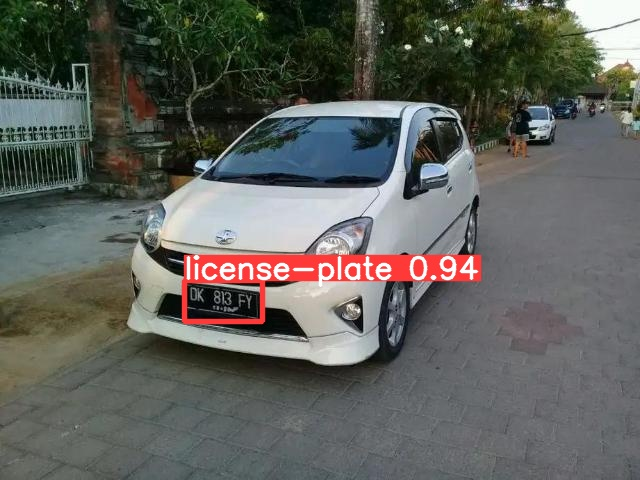

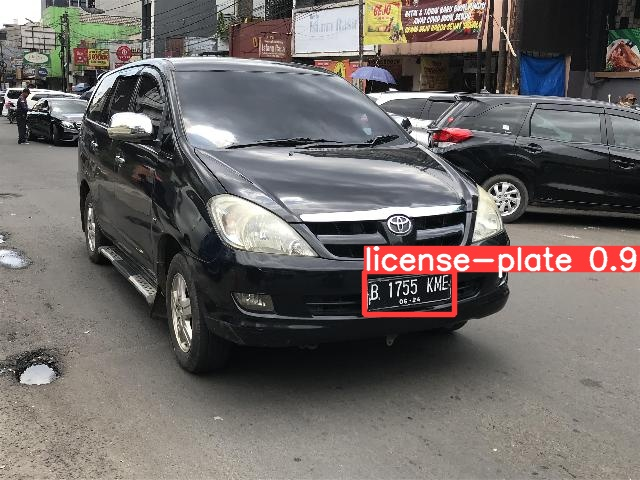

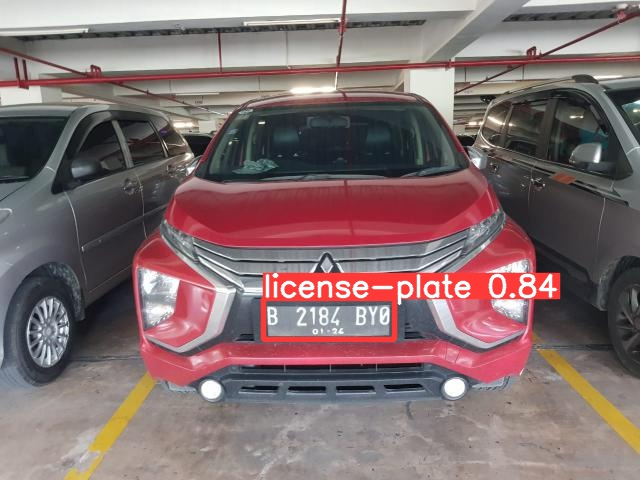

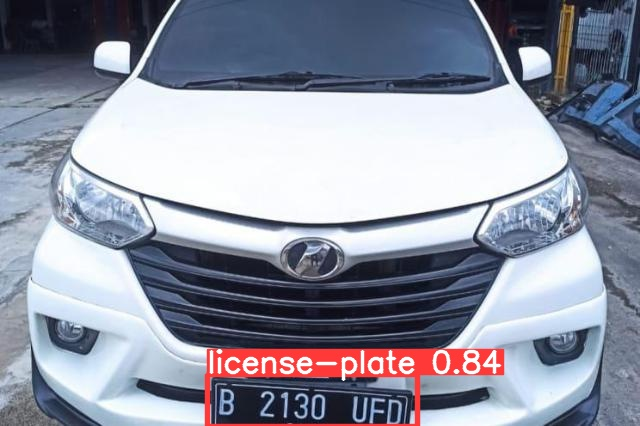

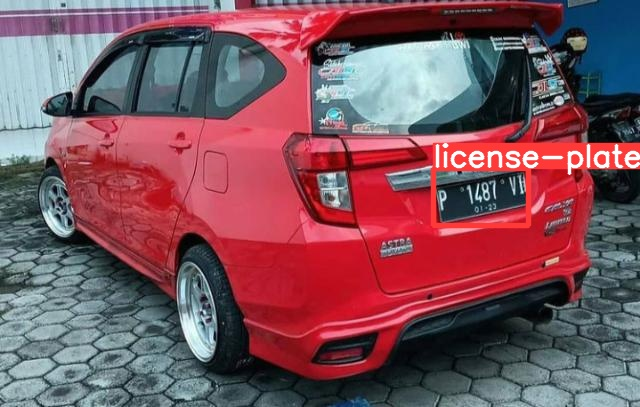

...

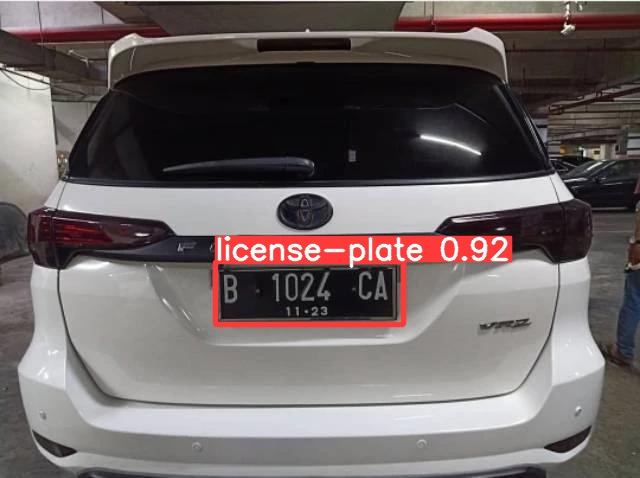

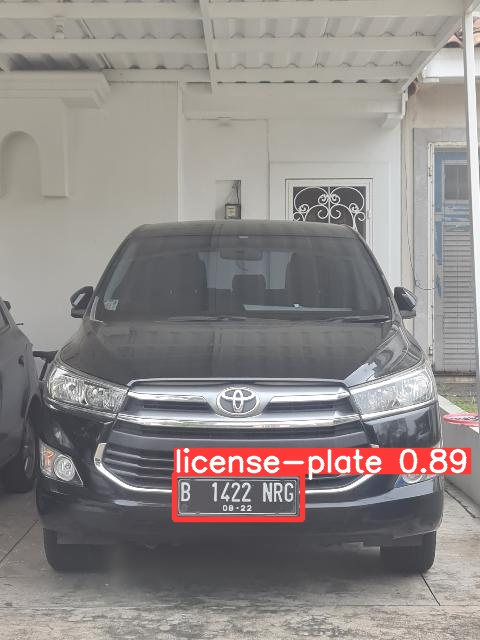

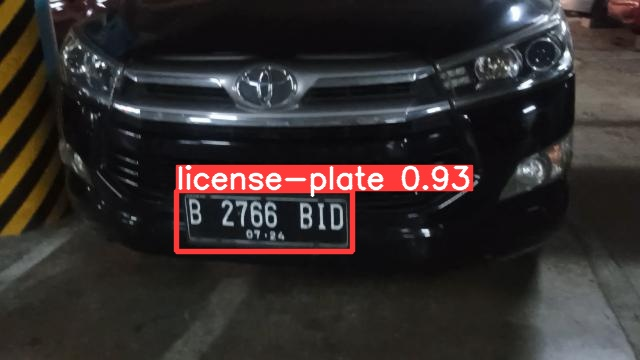

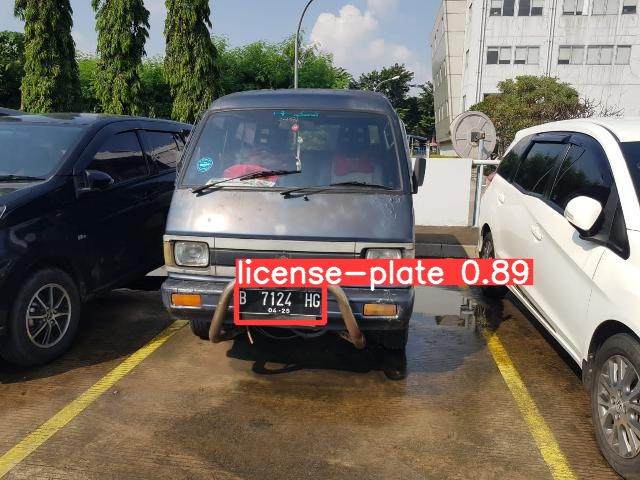

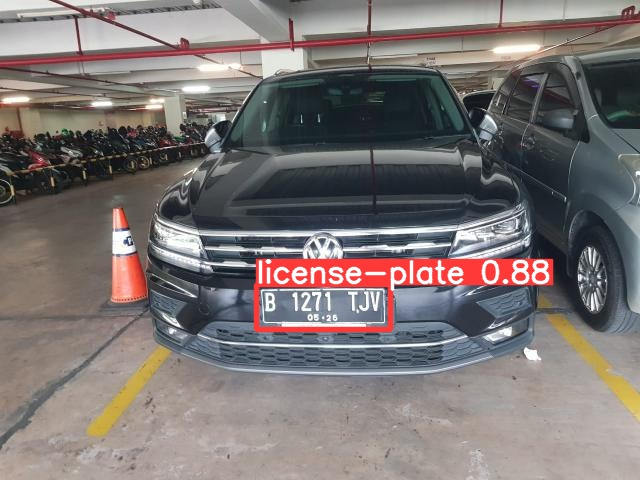

In [38]:
# display image
import glob
from IPython.display import Image, display

# change the 'exp' to according to what folder you store the results
# you can see the folder path of the inference at the end of previous cell

for imageName in glob.glob(os.path.join(os.getcwd(), 'yolov5','runs', 'detect', 'exp', '*.jpg')): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## Step 10: Export Model to TensorflowJS
Lastly, we export the model for deployment in Website using Javascript.

In [39]:
# export model
weight = os.path.join(os.getcwd(), 'yolov5','lpod_train_results','train_vlpd1_5s_freeze_backbone_','weights', 'best.pt')
# model_weights_path = input('Please input model path = ')
!cd yolov5 && python export.py --weights {weight} --include tfjs

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(1, 640, 640, 3)]   0           []                               
                                                                                                  
 tf_conv (TFConv)               (1, 320, 320, 32)    3488        ['input_1[0][0]']                
                                                                                                  
 tf_conv_1 (TFConv)             (1, 160, 160, 64)    18496       ['tf_conv[0][0]']                
                                                                                                  
 tfc3 (TFC3)                    (1, 160, 160, 64)    18624       ['tf_conv_1[0][0]']              
                                                                                              

export: data=C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\data\coco128.yaml, weights=['C:\\Users\\USER\\Documents\\GitHub\\VePay-Go-ML\\license-plate-object-detection\\yolov5\\lpod_train_results\\train_vlpd1_5s_freeze_backbone_\\weights\\best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tfjs']
YOLOv5  v6.1-244-g47233e1 Python-3.8.6 torch-1.9.0+cu102 CPU

Fusing layers... 
custom_YOLOv5s summary: 213 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from C:\Users\USER\Documents\GitHub\VePay-Go-ML\license-plate-object-detection\yolov5\lpod_train_results\train_vlpd1_5s_freeze_backbone_\weights\best.pt with output shape (1, 25200, 6) (13.8 MB)
2022-06-05 16:34:30.868529: W t

## Step 11: Create a Folder for Store Web-Models

In [40]:
web_models_folder = "web-models"

if not os.path.exists(os.path.join(os.getcwd(), web_models_folder)):
    os.mkdir(web_models_folder)
    print("web-models folder has been created")    

else:
    print("web-models folder already exists")

web-models folder already exists


In [44]:
# Source path
src = os.path.join(os.getcwd(), 'yolov5', 'lpod_train_results', 'train_vlpd1_5s_freeze_backbone_', 'weights', 'best_web_model')

# Destination path 
dest = os.path.join(os.getcwd(), web_models_folder, 'train_vlpd1_5s_freeze_backbone_')
   
# Copy the content of 
# source to destination 
if not os.path.exists(dest):
    destination = shutil.copytree(src, dest)
else:
    print("destination the folder already exists")

destination the folder already exists
